# Flood area segmentation

Dataset source: https://www.kaggle.com/datasets/faizalkarim/flood-area-segmentation

In [1]:
import os
import cv2
import math
import datetime

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import datasets, layers, models
from tensorflow.keras.utils import plot_model

from sklearn.model_selection import train_test_split

In [2]:
# Global constants
DATASET_ROOT = r"C:\Users\Minhaz\Documents\Projects\data\flood-area-segmentation"
IMAGES_ROOT = rf"{DATASET_ROOT}\Image"
MASK_ROOT = rf"{DATASET_ROOT}\Mask"
LOGDIR = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

# Global methods
def to_u8(im):
    assert im.dtype == np.float32
    assert im.min() >= 0.0
    assert im.max() <= 1.0
    return (im * 255).astype(np.uint8)

def to_f32(im):
    assert im.dtype == np.uint8
    return im.astype(np.float32) / 255.0

def normalize(im_f32):
    assert im_f32.dtype == np.float32
    return (im_f32 - 0.5) * 2.0

def load_image_rgb(path):
    if not os.path.exists(path):
        raise (f'{path} not exists')
    im = cv2.imread(path)
    if im is None:
        return None
    return to_f32(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))

def plot_n(images, titles, suptitle=None, imsize=(8,6), vmin=0, vmax=1, cmap='gray', scale=1, show_axis=False, show_im_dimensions=True):
    assert len(images) == len(titles)
    num_images = len(images)
    imsize = tuple(scale * np.array(imsize))
    figsize = (num_images * imsize[0], imsize[1])
    fig, axes = plt.subplots(1, num_images, figsize=figsize)
    for i in range(0, num_images):
        im = images[i]
        if cmap:
            axes[i].imshow(im, cmap=cmap, vmin=vmin, vmax=vmax)
        else:
            axes[i].imshow(im, vmin=vmin, vmax=vmax)
        title = titles[i]
        axes[i].set_title(title)
        if not show_axis:
            axes[i].axis('off')
    if suptitle:
        fig.suptitle(suptitle)
#     fig.show()

## GPU APIs

In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
  try:
    tf.config.set_visible_devices(gpus[0], 'GPU')
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
  except RuntimeError as e:
    # Visible devices must be set before GPUs have been initialized
    print(e)
    
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)
    
tf.config.run_functions_eagerly(False)

Num GPUs Available:  1
1 Physical GPUs, 1 Logical GPU
Physical devices cannot be modified after being initialized


## Dataset loader

In [4]:
IM_SIZE = 512

def get_all_samples(image_root=IMAGES_ROOT, mask_root=MASK_ROOT):
    images = os.listdir(image_root)
    masks = os.listdir(mask_root)
    mask_dir = {}
    for mask in masks:
        if '.png' in mask:
            mask_dir[mask.lower().replace('.png', '')] = mask
            
    result = []
    for image in images:
        if '.jpg' in image:
            base_name = image.lower().replace('.jpg', '')
            if base_name in mask_dir:
                result.append({'image': image, 'mask': mask_dir[base_name]})
    
    return result

def load_to_memory(samples, image_root=IMAGES_ROOT, mask_root=MASK_ROOT):
    def load_im(path):
        im = load_image_rgb(path)
        if im is None:
            return None
        im = cv2.resize(im, (IM_SIZE, IM_SIZE), interpolation=cv2.INTER_LINEAR)
        return im
    
    x = []
    y = []
    
    for sample in samples:
        im_path = os.path.join(image_root, sample['image'])
        mask_path = os.path.join(mask_root, sample['mask'])
        _x = load_im(im_path)
        _y = load_im(mask_path)
        if _x is not None and _y is not None:
            x.append(_x)
            if _y.ndim == 3:
                _y = cv2.cvtColor(_y, cv2.COLOR_RGB2GRAY)
            y.append(_y)
        
    return x, y
        

In [5]:
all_samples = get_all_samples()
train_samples, val_samples = train_test_split(all_samples, test_size=0.15, random_state=22)

x_train, y_train = load_to_memory(train_samples)
x_val, y_val = load_to_memory(val_samples)

In [8]:
class DatasetLoader(tf.keras.utils.Sequence):
    
    def __init__(self, x, y, batch_size=8, normalize_x=True):
        assert len(x) == len(y)
        if normalize_x:
            self.x = [normalize(_x) for _x in x]
        else:
            self.x = x
        self.y = y
        self.__apply_augmentation__()        
        self.batch_size = batch_size

    def __apply_augmentation__(self):
        def rotate(im, degrees):
            (h, w) = im.shape[:2]
            (cx, cy) = (w // 2, h // 2)
            matrix = cv2.getRotationMatrix2D((cx, cy), -degrees, 1.0)
            return cv2.warpAffine(im, matrix, (w,h))
        
        num_original_samples = len(self.x)
        # rotation
        for i in range(0, num_original_samples):
            for degree in [180, 270, 90]:
                self.x.append(rotate(self.x[i], degree))
                self.y.append(rotate(self.y[i], degree))
                
            for flip in [0, 1]: # 0 - vertical, 1 - horizontal
                self.x.append(cv2.flip(self.x[i], flip))
                self.y.append(cv2.flip(self.y[i], flip))
    
    def __len__(self):
        return int(math.ceil(len(self.x) / self.batch_size))
    
    def size(self):
        return len(self.x)
    
    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size: (idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size: (idx + 1) * self.batch_size]
        return np.array(batch_x), np.array(batch_y)

In [9]:
BATCH_SIZE = 4
NORMALIZE_INPUT = True

training_generator = DatasetLoader(x_train, y_train, batch_size=BATCH_SIZE, normalize_x=NORMALIZE_INPUT)
val_generator = DatasetLoader(x_val, y_val, batch_size=BATCH_SIZE, normalize_x=NORMALIZE_INPUT)

print(f'Training - {training_generator.size()}')
print(f'Validation - {val_generator.size()}')


Training - 1470
Validation - 264


## Model training

In [10]:
def downsample(input, filters=32, kernel_size=(3,3), pool_size=(2,2), activation='relu', padding='same'):
    x = layers.Conv2D(filters, kernel_size, activation=activation, padding=padding)(input)
    x = layers.MaxPooling2D(pool_size, padding='same')(x)
    return x

def upsample(input, filters=32, kernel_size=(3,3), strides=2, activation='relu', padding='same'):
    return layers.Conv2DTranspose(filters, kernel_size, strides=strides, activation=activation, padding=padding)(input)

def predict(im, model, threshold=0.5, normalize_x=NORMALIZE_INPUT):
    if normalize_x:
        im = normalize(im)
    predicted = model.predict(im.reshape((1,) + im.shape))
    result = np.squeeze(predicted)
    _, t = cv2.threshold(result, threshold, 1.0, cv2.THRESH_BINARY)
    return t

def mask_image(im, mask):
    result = np.copy(im)
    result[:, :, 0] = np.where(mask == 1, 1, result[:, :, 0])
    result[:, :, 1] = np.where(mask == 1, 0, result[:, :, 1])
    result[:, :, 2] = np.where(mask == 1, 0, result[:, :, 2])
    return result

In [15]:
tf.keras.backend.clear_session()

activation = tf.keras.layers.LeakyReLU()

input = layers.Input(shape=(IM_SIZE, IM_SIZE, 3))
x0 = layers.Conv2D(1, kernel_size=(3,3), padding='same',
                   activation=activation)(input)

# x1 = x0
x1 = downsample(input, filters=128, activation=activation) # 512 -> 256
x2 = downsample(x1, filters=128, activation=activation)  # 256 -> 128
x3 = downsample(x2, filters=64, activation=activation) # 128 -> 64
x4 = downsample(x3, filters=32, activation=activation) # 64 -> 32

encoder = x4

# Decoder
y1 = upsample(encoder, filters=32, activation=activation) # 32 -> 64
y2 = upsample(y1, filters=64, activation=activation) # 64 -> 128
y3 = upsample(y2, filters=128, activation=activation) # 128 -> 256
y3 = layers.Add()([y3, x1])
y4 = upsample(y3, filters=128, activation=activation) # 256 -> 512
y4 = layers.Add()([y4, x0])

decoder = y4

final_layer = layers.Conv2D(1, (3,3), activation='sigmoid', padding='same', name='final_layer_bce')(decoder)

encoder_decoder = models.Model(input, final_layer)
encoder_decoder.compile(optimizer='adam', loss='binary_crossentropy',
                       metrics=[tf.keras.metrics.BinaryIoU()])

encoder_decoder.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 512, 512, 12  3584        ['input_1[0][0]']                
                                8)                                                                
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 256, 256, 12  0           ['conv2d_1[0][0]']               
                                8)                                                            

In [ ]:
print(LOGDIR)
%reload_ext tensorboard
%tensorboard --logdir=r"logs\\20230102-180533" --host localhost --port 6006

#### TODOS
 - [ ] Checkpointing

In [ ]:
EPOCHS = 50
tensorboard_callback = tf.keras.callbacks.TensorBoard(LOGDIR, histogram_freq=1)

with tf.device('/device:GPU:0'):
    history = encoder_decoder.fit(
        x=training_generator,
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        shuffle=True,
        validation_data=val_generator,
        callbacks=[tensorboard_callback]
    )
    
    model_history = pd.DataFrame(history.history)
    model_history['epoch'] = history.epoch

    fig, ax = plt.subplots(1, figsize=(8,6))
    num_epochs = model_history.shape[0]
    ax.plot(np.arange(0, num_epochs), model_history['loss'], label='training loss')
    ax.plot(np.arange(0, num_epochs), model_history['val_loss'], label='valiation loss')
    ax.legend()
    plt.tight_layout()
    plt.show()

Epoch 1/50
368/368 [==============================] - 110s 287ms/step - loss: 0.5016 - binary_io_u: 0.6161 - val_loss: 0.4175 - val_binary_io_u: 0.7135
Epoch 2/50
368/368 [==============================] - 106s 287ms/step - loss: 0.4378 - binary_io_u: 0.6648 - val_loss: 0.3918 - val_binary_io_u: 0.7071
Epoch 3/50
368/368 [==============================] - 111s 301ms/step - loss: 0.4220 - binary_io_u: 0.6787 - val_loss: 0.3977 - val_binary_io_u: 0.7135
Epoch 4/50
368/368 [==============================] - 115s 312ms/step - loss: 0.4116 - binary_io_u: 0.6833 - val_loss: 0.3821 - val_binary_io_u: 0.7119
Epoch 5/50
368/368 [==============================] - 117s 317ms/step - loss: 0.4090 - binary_io_u: 0.6860 - val_loss: 0.4260 - val_binary_io_u: 0.7108
Epoch 6/50
368/368 [==============================] - 117s 319ms/step - loss: 0.4024 - binary_io_u: 0.6927 - val_loss: 0.3903 - val_binary_io_u: 0.6983
Epoch 7/50
243/368 [==================>...........] - ETA: 38s - loss: 0.3784 - binary_i

In [ ]:
for idx in [1, 5, 9, 10, 12, 22]:
    _x = x_val[idx]
    _y = y_val[idx]
#     _y = cv2.cvtColor(_y, cv2.COLOR_RGB2GRAY)
    y_predicted = predict(_x, encoder_decoder, threshold=0.75)
    

    # plt.imshow(y_predicted)
#     plot_n([_x, _y, y_predicted, mask_image(_x, y_predicted)], ['Image', 'Ground Truth', 'Predicted', 'Masked image'], suptitle=f'Sample {idx}')
    plot_n([_x, mask_image(_x, _y), mask_image(_x, y_predicted)], ['Image', 'Masked GT', 'Masked image'], suptitle=f'Sample {idx}', scale=2)
    


## Unet Model

In [11]:
def get_model(img_size):
    inputs = tf.keras.Input(shape=img_size + (3,))

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
#     final_layer = layers.Conv2D(1, (3,3), activation='sigmoid', padding='same', name='final_layer_bce')(decoder)
    outputs = layers.Conv2D(1, (3, 3), activation="sigmoid", padding="same", name='final_layer_bce')(x)

    # Define the model
    model = tf.keras.Model(inputs, outputs)
    return model

# Free up RAM in case the model definition cells were run multiple times
tf.keras.backend.clear_session()

# Build model
unet = get_model((IM_SIZE, IM_SIZE))
unet.compile(optimizer='adam', loss='binary_crossentropy',
                       metrics=[tf.keras.metrics.BinaryIoU()])
unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

 max_pooling2d_2 (MaxPooling2D)  (None, 32, 32, 256)  0          ['batch_normalization_6[0][0]']  
                                                                                                  
 conv2d_3 (Conv2D)              (None, 32, 32, 256)  33024       ['add_1[0][0]']                  
                                                                                                  
 add_2 (Add)                    (None, 32, 32, 256)  0           ['max_pooling2d_2[0][0]',        
                                                                  'conv2d_3[0][0]']               
                                                                                                  
 activation_7 (Activation)      (None, 32, 32, 256)  0           ['add_2[0][0]']                  
                                                                                                  
 conv2d_transpose (Conv2DTransp  (None, 32, 32, 256)  590080     ['activation_7[0][0]']           
 ose)     

                                                                                                  
 conv2d_6 (Conv2D)              (None, 256, 256, 64  8256        ['up_sampling2d_5[0][0]']        
                                )                                                                 
                                                                                                  
 add_5 (Add)                    (None, 256, 256, 64  0           ['up_sampling2d_4[0][0]',        
                                )                                 'conv2d_6[0][0]']               
                                                                                                  
 activation_13 (Activation)     (None, 256, 256, 64  0           ['add_5[0][0]']                  
                                )                                                                 
                                                                                                  
 conv2d_tr

Epoch 1/40
368/368 [==============================] - 98s 235ms/step - loss: 0.5693 - binary_io_u: 0.6608 - val_loss: 0.5012 - val_binary_io_u: 0.6603
Epoch 2/40
368/368 [==============================] - 86s 232ms/step - loss: 0.3807 - binary_io_u: 0.7172 - val_loss: 0.3714 - val_binary_io_u: 0.7271
Epoch 3/40
368/368 [==============================] - 86s 234ms/step - loss: 0.3546 - binary_io_u: 0.7377 - val_loss: 0.3855 - val_binary_io_u: 0.7154
Epoch 4/40
368/368 [==============================] - 87s 237ms/step - loss: 0.3406 - binary_io_u: 0.7478 - val_loss: 0.3379 - val_binary_io_u: 0.7461
Epoch 5/40
368/368 [==============================] - 89s 241ms/step - loss: 0.3120 - binary_io_u: 0.7677 - val_loss: 0.3452 - val_binary_io_u: 0.7493
Epoch 6/40
368/368 [==============================] - 90s 244ms/step - loss: 0.2995 - binary_io_u: 0.7781 - val_loss: 0.3453 - val_binary_io_u: 0.7751
Epoch 7/40
368/368 [==============================] - 90s 244ms/step - loss: 0.2918 - binary_i

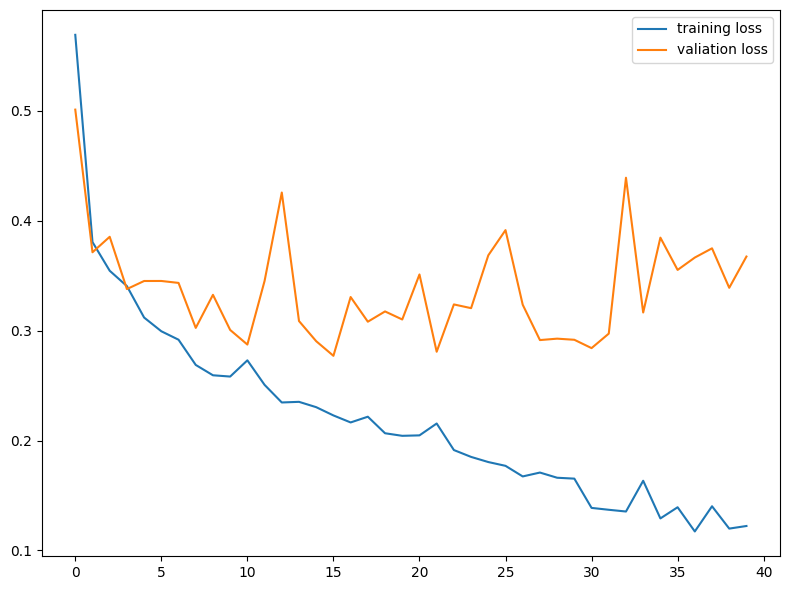

In [12]:
EPOCHS = 40
tensorboard_callback = tf.keras.callbacks.TensorBoard(LOGDIR, histogram_freq=1)

with tf.device('/device:GPU:0'):
    history = unet.fit(
        x=training_generator,
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        shuffle=True,
        validation_data=val_generator,
        callbacks=[tensorboard_callback]
    )
    
    model_history = pd.DataFrame(history.history)
    model_history['epoch'] = history.epoch

    fig, ax = plt.subplots(1, figsize=(8,6))
    num_epochs = model_history.shape[0]
    ax.plot(np.arange(0, num_epochs), model_history['loss'], label='training loss')
    ax.plot(np.arange(0, num_epochs), model_history['val_loss'], label='valiation loss')
    ax.legend()
    plt.tight_layout()
    plt.show()

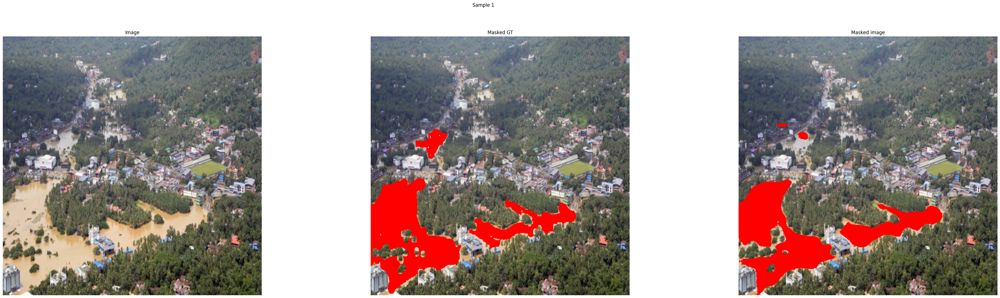

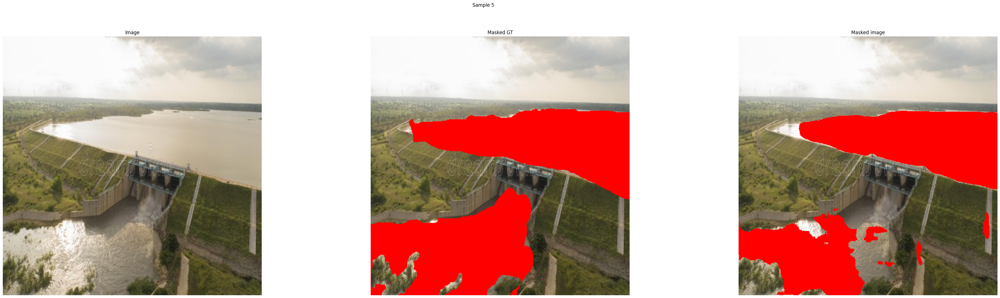

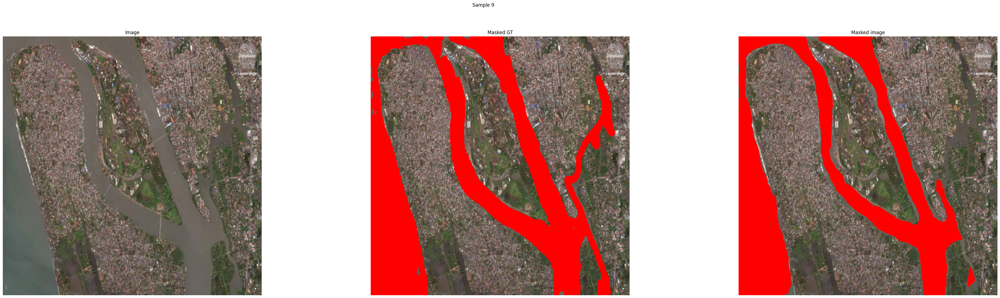

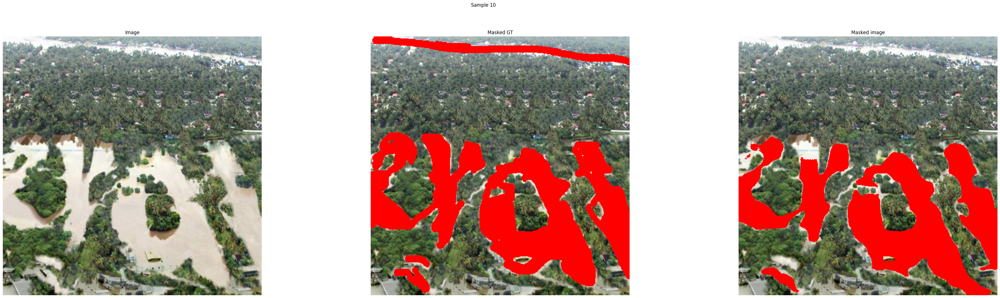

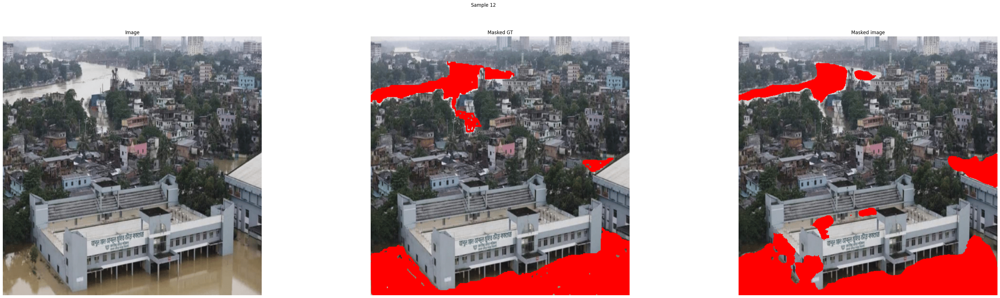

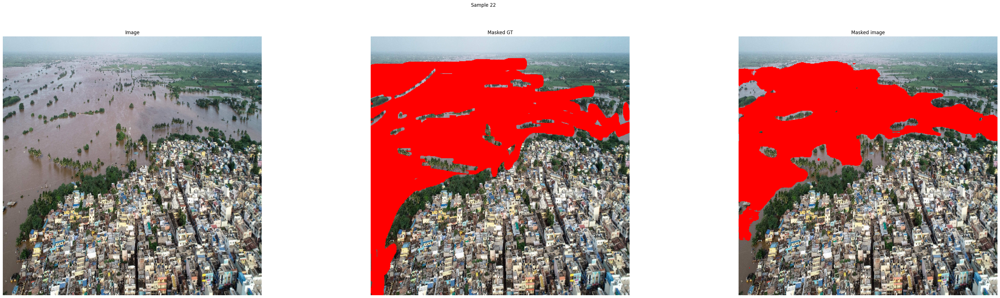

In [14]:
for idx in [1, 5, 9, 10, 12, 22]:
    _x = x_val[idx]
    _y = y_val[idx]
#     _x = x_train[idx]
#     _y = y_train[idx]
#     _y = cv2.cvtColor(_y, cv2.COLOR_RGB2GRAY)
    y_predicted = predict(_x, unet, threshold=0.75)
    

    # plt.imshow(y_predicted)
#     plot_n([_x, _y, y_predicted, mask_image(_x, y_predicted)], ['Image', 'Ground Truth', 'Predicted', 'Masked image'], suptitle=f'Sample {idx}')
    plot_n([_x, mask_image(_x, _y), mask_image(_x, y_predicted)], ['Image', 'Masked GT', 'Masked image'], suptitle=f'Sample {idx}', scale=2)
    

## Transfer learning
